# 🎓 Student's Performance Prediction Project

# Data Understanding

## Dataset Columns Description

| Column Name | Description |
|------------|------------|
| **student_id** | Unique identifier for each student. |
| **age** | Age of the student in years. |
| **gender** | Gender of the student (Male / Female). |
| **major** | Academic major or field of study. |
| **study_hours_per_day** | Average number of hours the student studies per day. |
| **social_media_hours** | Average daily time spent on social media. |
| **netflix_hours** | Average daily time spent watching Netflix or similar platforms. |
| **part_time_job** | Whether the student has a part-time job (Yes / No). |
| **attendance_percentage** | Percentage of classes attended by the student. |
| **sleep_hours** | Average number of hours the student sleeps per night. |
| **diet_quality** | Quality of the student’s diet (e.g., Poor, Average, Good). |
| **exercise_frequency** | Frequency of physical exercise. |
| **parental_education_level** | Highest education level attained by the parents. |
| **internet_quality** | Quality of internet access available to the student. |
| **mental_health_rating** | Self-reported mental health rating. |
| **extracurricular_participation** | Participation in extracurricular activities (Yes / No). |
| **previous_gpa** | Grade Point Average from the previous academic term. |
| **semester** | Current academic semester. |
| **stress_level** | Level of academic or personal stress experienced by the student. |
| **dropout_risk** | Estimated risk of student dropout. |
| **social_activity** | Level of social activity with peers. |
| **screen_time** | Total daily screen time across all devices. |
| **study_environment** | Quality of the study environment (e.g., Quiet, Moderate, Noisy). |
| **access_to_tutoring** | Whether the student has access to private tutoring. |
| **family_income_range** | Household income range of the student’s family. |
| **parental_support_level** | Level of academic and emotional support from parents. |
| **motivation_level** | Student’s motivation level toward academic success. |
| **exam_anxiety_score** | Score representing anxiety level during exams. |
| **learning_style** | Preferred learning style (Visual, Auditory, Kinesthetic, etc.). |
| **time_management_score** | Score representing the student’s time management skills. |
| **exam_score** | Final exam score achieved by the student (**Target Variable**). |


In [1]:
import numpy as np
import pandas as pd
import plotly.express as px

In [2]:
df = pd.read_csv('enhanced_student_habits_performance_dataset2.csv')
df.head(10)

,student_id,age,gender,major,study_hours_per_day,social_media_hours,netflix_hours,part_time_job,attendance_percentage,sleep_hours,...,screen_time,study_environment,access_to_tutoring,family_income_range,parental_support_level,motivation_level,exam_anxiety_score,learning_style,time_management_score,exam_score
0,100000,26,Male,Computer Science,7.645367,3.0H,0.1,Yes,70.3,6.2,...,10.9,Co-Learning Group,Yes,High,9.0,7,8.0,Reading,3.0,100
1,100001,28,Male,Arts,5.700000,0.5H,0.4,No,88.4,7.2,...,8.3,Co-Learning Group,Yes,Low,7.0,2,10.0,Reading,6.0,99
2,100002,17,Male,Arts,2.400000,4.2H,0.7,No,82.1,9.2,...,8.0,Library,Yes,High,3.0,9,6.0,Kinesthetic,7.6,98
3,100003,27,Other,Psychology,3.400000,4.6H,2.3,Yes,79.3,4.2,...,11.7,Co-Learning Group,Yes,Low,5.0,3,10.0,Reading,3.2,100
4,100004,25,Female,Business,4.700000,0.8H,2.7,Yes,62.9,6.5,...,9.4,Quiet Room,Yes,Medium,9.0,1,10.0,Reading,7.1,98
5,100005,17,Female,Engineering,4.200000,0.5H,2.5,No,49.2,9.2,...,8.9,Quiet Room,No,High,1.0,10,5.0,Visual,3.9,94
6,100006,19,Male,Psychology,4.100000,2.4H,2.2,Yes,97.9,8.5,...,9.2,Dorm,Yes,High,5.0,7,8.0,Kinesthetic,10.0,97
7,100007,17,Male,Psychology,4.100000,3.2H,0.9,No,44.3,7.4,...,10.0,Co-Learning Group,Yes,Low,9.0,3,10.0,Kinesthetic,7.5,84
8,100008,28,Female,Psychology,0.600000,0.3H,2.6,Yes,64.2,7.6,...,4.8,Library,No,Low,4.0,4,10.0,Kinesthetic,5.8,70
9,100009,19,Male,Engineering,5.200000,1.1H,1.6,Yes,40.1,7.2,...,8.0,Cafe,Yes,Medium,7.0,9,6.0,Auditory,7.0,100


# Data Exploration

In [3]:
# Check data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81680 entries, 0 to 81679
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   student_id                     81680 non-null  int64  
 1   age                            81680 non-null  int64  
 2   gender                         81680 non-null  object 
 3   major                          81680 non-null  object 
 4   study_hours_per_day            81680 non-null  float64
 5   social_media_hours             81680 non-null  object 
 6   netflix_hours                  81680 non-null  float64
 7   part_time_job                  81680 non-null  object 
 8   attendance_percentage          77600 non-null  float64
 9   sleep_hours                    78480 non-null  float64
 10  diet_quality                   81680 non-null  object 
 11  exercise_frequency             81680 non-null  int64  
 12  parental_education_level       81680 non-null 

In [4]:
# Check Summary statistics for numerical columns
df.describe().round(2)

,student_id,age,study_hours_per_day,netflix_hours,attendance_percentage,sleep_hours,exercise_frequency,mental_health_rating,previous_gpa,semester,stress_level,social_activity,screen_time,parental_support_level,motivation_level,exam_anxiety_score,time_management_score,exam_score
count,81680.00,81680.00,81680.00,81680.00,77600.00,78480.00,81680.00,80080.00,34952.00,81680.0,81680.00,81680.0,81680.00,76800.00,81680.00,79504.00,81680.0,81680.00
mean,140005.32,22.00,4.17,2.00,69.97,7.02,3.52,6.81,3.60,4.5,5.01,2.5,9.67,5.48,5.49,8.51,5.5,89.13
std,23093.18,3.75,2.00,1.16,17.33,1.47,2.29,1.92,0.46,2.3,1.95,1.7,2.78,2.87,2.87,1.80,2.6,11.60
min,100000.00,16.00,0.00,0.00,40.00,4.00,0.00,1.00,1.75,1.0,1.00,0.0,0.30,1.00,1.00,5.00,1.0,36.00
25%,120016.75,19.00,2.80,1.00,55.00,6.00,2.00,5.50,3.28,2.0,3.60,1.0,7.80,3.00,3.00,7.00,3.2,82.00
50%,140003.50,22.00,4.12,2.00,69.90,7.00,4.00,6.90,3.79,5.0,5.00,2.0,9.70,5.00,5.00,10.00,5.5,93.00
75%,160012.25,25.00,5.50,3.00,84.90,8.00,6.00,8.20,4.00,7.0,6.40,4.0,11.60,8.00,8.00,10.00,7.8,100.00
max,179999.00,28.00,12.00,4.00,100.00,12.00,7.00,10.00,4.00,8.0,10.00,5.0,21.00,10.00,10.00,10.00,10.0,100.00


In [5]:
# Check Summary statistics for Categorical columns
df.describe(include= ['object'])

,gender,major,social_media_hours,part_time_job,diet_quality,parental_education_level,internet_quality,extracurricular_participation,dropout_risk,study_environment,access_to_tutoring,family_income_range,learning_style
count,81680,81680,81680,81680,81680,81680,81680,81680,81680,81680,81680,81680,81680
unique,3,6,51,2,3,5,3,2,2,5,2,3,4
top,Male,Arts,3.0H,No,Good,High School,High,No,No,Dorm,No,Low,Kinesthetic
freq,27248,13804,1738,41037,40796,16450,27302,40916,80060,16459,40879,27273,20580


In [6]:
# Check duplicates
df.duplicated().sum()

np.int64(1680)

In [7]:
# Check Missing Values
df.isna().sum()

student_id                           0
age                                  0
gender                               0
major                                0
study_hours_per_day                  0
social_media_hours                   0
netflix_hours                        0
part_time_job                        0
attendance_percentage             4080
sleep_hours                       3200
diet_quality                         0
exercise_frequency                   0
parental_education_level             0
internet_quality                     0
mental_health_rating              1600
extracurricular_participation        0
previous_gpa                     46728
semester                             0
stress_level                         0
dropout_risk                         0
social_activity                      0
screen_time                          0
study_environment                    0
access_to_tutoring                   0
family_income_range                  0
parental_support_level   

In [8]:
# Check Missing Values by percentage
df.isna().mean().round(4) * 100

student_id                        0.00
age                               0.00
gender                            0.00
major                             0.00
study_hours_per_day               0.00
social_media_hours                0.00
netflix_hours                     0.00
part_time_job                     0.00
attendance_percentage             5.00
sleep_hours                       3.92
diet_quality                      0.00
exercise_frequency                0.00
parental_education_level          0.00
internet_quality                  0.00
mental_health_rating              1.96
extracurricular_participation     0.00
previous_gpa                     57.21
semester                          0.00
stress_level                      0.00
dropout_risk                      0.00
social_activity                   0.00
screen_time                       0.00
study_environment                 0.00
access_to_tutoring                0.00
family_income_range               0.00
parental_support_level   

# Data Cleaning

In [9]:
df.drop_duplicates(inplace=True,ignore_index=True)

In [10]:
df.duplicated().sum()

np.int64(0)

In [11]:
df.head()

,student_id,age,gender,major,study_hours_per_day,social_media_hours,netflix_hours,part_time_job,attendance_percentage,sleep_hours,...,screen_time,study_environment,access_to_tutoring,family_income_range,parental_support_level,motivation_level,exam_anxiety_score,learning_style,time_management_score,exam_score
0,100000,26,Male,Computer Science,7.645367,3.0H,0.1,Yes,70.3,6.2,...,10.9,Co-Learning Group,Yes,High,9.0,7,8.0,Reading,3.0,100
1,100001,28,Male,Arts,5.700000,0.5H,0.4,No,88.4,7.2,...,8.3,Co-Learning Group,Yes,Low,7.0,2,10.0,Reading,6.0,99
2,100002,17,Male,Arts,2.400000,4.2H,0.7,No,82.1,9.2,...,8.0,Library,Yes,High,3.0,9,6.0,Kinesthetic,7.6,98
3,100003,27,Other,Psychology,3.400000,4.6H,2.3,Yes,79.3,4.2,...,11.7,Co-Learning Group,Yes,Low,5.0,3,10.0,Reading,3.2,100
4,100004,25,Female,Business,4.700000,0.8H,2.7,Yes,62.9,6.5,...,9.4,Quiet Room,Yes,Medium,9.0,1,10.0,Reading,7.1,98


In [12]:
df['social_media_hours']=df['social_media_hours'].str.replace('H','').astype(float)
df['social_media_hours']

0        3.0
1        0.5
2        4.2
3        4.6
4        0.8
        ... 
79995    2.1
79996    0.4
79997    1.6
79998    0.6
79999    4.5
Name: social_media_hours, Length: 80000, dtype: float64

In [13]:
col_has_nan=df.isna().mean().round(4) * 100
col_has_nan[col_has_nan>0]

attendance_percentage      3.00
sleep_hours                2.00
mental_health_rating       1.00
previous_gpa              56.31
parental_support_level     4.00
exam_anxiety_score         1.36
dtype: float64

In [14]:
df.drop(['student_id','previous_gpa'], axis= 1, inplace= True)

In [15]:
df.duplicated().sum()

np.int64(0)

In [16]:
df.dropna(subset= ['attendance_percentage', 'sleep_hours', 'mental_health_rating',
       'parental_support_level', 'exam_anxiety_score'], ignore_index= True, inplace= True)

In [17]:
df.isna().mean().round(4) * 100

age                              0.0
gender                           0.0
major                            0.0
study_hours_per_day              0.0
social_media_hours               0.0
netflix_hours                    0.0
part_time_job                    0.0
attendance_percentage            0.0
sleep_hours                      0.0
diet_quality                     0.0
exercise_frequency               0.0
parental_education_level         0.0
internet_quality                 0.0
mental_health_rating             0.0
extracurricular_participation    0.0
semester                         0.0
stress_level                     0.0
dropout_risk                     0.0
social_activity                  0.0
screen_time                      0.0
study_environment                0.0
access_to_tutoring               0.0
family_income_range              0.0
parental_support_level           0.0
motivation_level                 0.0
exam_anxiety_score               0.0
learning_style                   0.0
t

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76800 entries, 0 to 76799
Data columns (total 29 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            76800 non-null  int64  
 1   gender                         76800 non-null  object 
 2   major                          76800 non-null  object 
 3   study_hours_per_day            76800 non-null  float64
 4   social_media_hours             76800 non-null  float64
 5   netflix_hours                  76800 non-null  float64
 6   part_time_job                  76800 non-null  object 
 7   attendance_percentage          76800 non-null  float64
 8   sleep_hours                    76800 non-null  float64
 9   diet_quality                   76800 non-null  object 
 10  exercise_frequency             76800 non-null  int64  
 11  parental_education_level       76800 non-null  object 
 12  internet_quality               76800 non-null 

#### In depth check for Numerical Columns

In [19]:
num_cols = df.select_dtypes(include= 'number').columns
num_cols

Index(['age', 'study_hours_per_day', 'social_media_hours', 'netflix_hours',
       'attendance_percentage', 'sleep_hours', 'exercise_frequency',
       'mental_health_rating', 'semester', 'stress_level', 'social_activity',
       'screen_time', 'parental_support_level', 'motivation_level',
       'exam_anxiety_score', 'time_management_score', 'exam_score'],
      dtype='object')

In [20]:
for col in num_cols:

    px.histogram(data_frame= df, x= col, title= col).show()

#### In depth Check for Categorical Columns

In [21]:
cols_obj=df.select_dtypes(include='O').columns
cols_obj


Index(['gender', 'major', 'part_time_job', 'diet_quality',
       'parental_education_level', 'internet_quality',
       'extracurricular_participation', 'dropout_risk', 'study_environment',
       'access_to_tutoring', 'family_income_range', 'learning_style'],
      dtype='object')

In [22]:
for col in cols_obj:
    print(col)
    print(df[col].nunique())
    print(df[col].unique())
    print('*'*10)
    print(df[col].value_counts())
    print("_"*100)

gender
3
['Male' 'Other' 'Female']
**********
gender
Female    25647
Male      25633
Other     25520
Name: count, dtype: int64
____________________________________________________________________________________________________
major
6
['Computer Science' 'Arts' 'Psychology' 'Business' 'Engineering' 'Biology']
**********
major
Arts                12934
Psychology          12933
Computer Science    12786
Business            12744
Engineering         12708
Biology             12695
Name: count, dtype: int64
____________________________________________________________________________________________________
part_time_job
2
['Yes' 'No']
**********
part_time_job
No     38550
Yes    38250
Name: count, dtype: int64
____________________________________________________________________________________________________
diet_quality
3
['Poor' 'Good' 'Fair']
**********
diet_quality
Good    38340
Fair    25650
Poor    12810
Name: count, dtype: int64
___________________________________________________

# Data Analysis

In [23]:
import plotly.express as px

# Histogram to show distribution of exam scores
fig = px.histogram(
    df,
    x='exam_score',                  # Target variable
    nbins=50,                        # Number of bins
    title='Distribution of Exam Scores',
    color_discrete_sequence=['#636EFA']  # Blue color
)

fig.update_layout(
    xaxis_title='Exam Score',
    yaxis_title='Count'
)

fig.show()


In [24]:
# Boxplot to detect outliers in study hours
fig = px.box(
    df,
    x='study_hours_per_day',
    title='Study Hours per Day Distribution',
    color_discrete_sequence=['#00CC96']  # Green color
)

fig.update_layout(
    xaxis_title='Study Hours per Day'
)

fig.show()


In [25]:
# Histogram for sleep hours
fig = px.histogram(
    df,
    x='sleep_hours',
    nbins=20,
    title='Sleep Hours Distribution',
    
)

fig.update_layout(
    xaxis_title='Sleep Hours per Night',
    yaxis_title='Count'
)

fig.show()


In [26]:
# Bar chart for stress levels
fig = px.bar(
    df['stress_level'].value_counts().reset_index(),
    y='count',
    x='stress_level',
    title='Stress Level Distribution',
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig.show()


In [27]:
# Bar chart for motivation levels
fig = px.bar(
    df['motivation_level'].value_counts().reset_index(),
    x='motivation_level',
    y='count',
    title='Motivation Level Distribution',
    labels={'index': 'Motivation Level', 'motivation_level': 'Count'},
    color_discrete_sequence=px.colors.qualitative.Pastel
)

fig.show()


## Bivariate Analysis

In [28]:
# Scatter plot to show relationship between study hours and exam score
fig = px.scatter(
    df.sample(2000,random_state=42),
    x='exam_score',
    y='study_hours_per_day',
    title='Exam Score vs Study Hours per Day',
    opacity=0.7
)

fig.update_layout(
    xaxis_title='Exam Score',
    yaxis_title='Study Hours per Day'
    
)

fig.show()

In [29]:
# Scatter plot for attendance vs exam score
fig = px.scatter(
    df,
    x='attendance_percentage',
    y='exam_score',
    title='Exam Score vs Attendance Percentage',
    opacity=0.7
)

fig.update_layout(
    xaxis_title='Attendance Percentage',
    yaxis_title='Exam Score'
)

fig.show()


In [30]:
# Boxplot to analyze exam score by motivation level
fig = px.box(
    df,
    x='motivation_level',
    y='exam_score',
    title='Exam Score by Motivation Level',
)

fig.update_layout(
    xaxis_title='Motivation Level',
    yaxis_title='Exam Score'
)

fig.show()


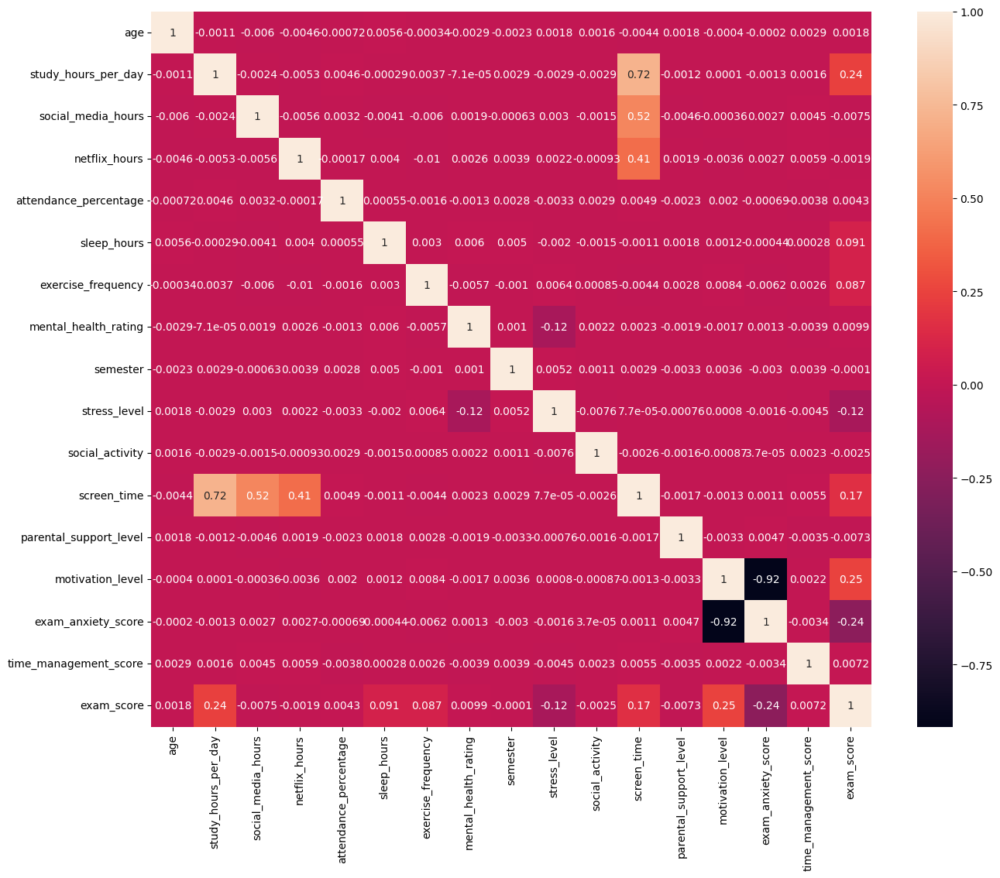

In [31]:
# Select numerical columns for correlation analysis
import matplotlib.pyplot as plt
import seaborn as sns
num_cols = [
    'exam_score',
    'study_hours_per_day',
    'attendance_percentage',
    'sleep_hours',
    'time_management_score',
    'exam_anxiety_score',
    'study_efficiency'
]

# Compute correlation matrix
corr = df[df.select_dtypes(include='number').columns].corr()

# Plot heatmap
plt.figure(figsize=(15,12))
fig = sns.heatmap(corr ,annot=True)

plt.show()


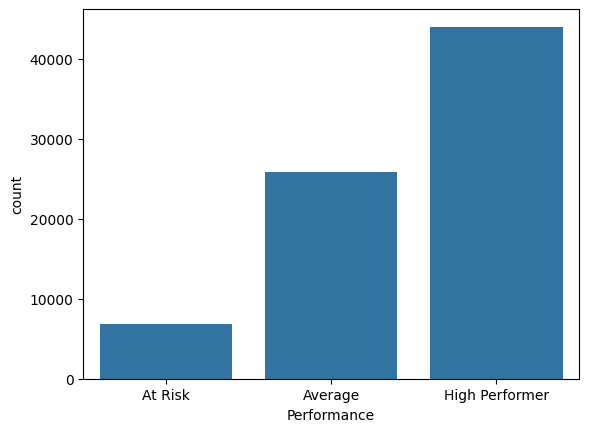

In [36]:
df['Performance']=pd.cut(df['exam_score'],bins=[0,70,90,np.inf] ,labels = ['At Risk', 'Average', 'High Performer'])
sns.countplot(data=df, x='Performance')
plt.show()

### Which behavioral factors have the strongest impact on students’ exam scores?

In [37]:

behavioral_features =['age', 'study_hours_per_day', 'social_media_hours', 'netflix_hours',
       'attendance_percentage', 'sleep_hours', 'exercise_frequency',
       'mental_health_rating', 'semester', 'stress_level', 'social_activity',
       'screen_time', 'parental_support_level', 'motivation_level',
       'exam_anxiety_score', 'time_management_score' 
        ]

corr_df = (
    df[behavioral_features + ['exam_score']]
    .corr()['exam_score']
    .drop('exam_score')
    .reset_index()
    .rename(columns={'index': 'Feature', 'exam_score': 'Correlation'})
)

fig = px.bar(
    corr_df.sort_values('Correlation'),
    x='Correlation',
    y='Feature',
    orientation='h',
    title='Impact of Behavioral Factors on Exam Score',
    color='Correlation',
    color_continuous_scale='RdBu'
)

fig.show()


### What is the average sleep duration for each performance class?

In [38]:
df.groupby('Performance')['sleep_hours'].mean()

C:\Users\hp\AppData\Local\Temp\ipykernel_14844\1427501495.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Performance
At Risk           6.697258
Average           6.944100
High Performer    7.111094
Name: sleep_hours, dtype: float64

### How does exam anxiety influence student performance?

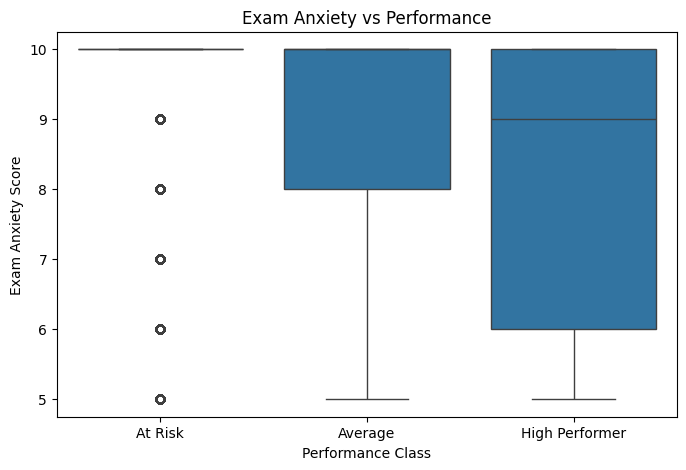

In [42]:
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x='Performance', y='exam_anxiety_score')
plt.title("Exam Anxiety vs Performance")
plt.xlabel("Performance Class")
plt.ylabel("Exam Anxiety Score")
plt.show()


### Does sleep hours affect student performance?

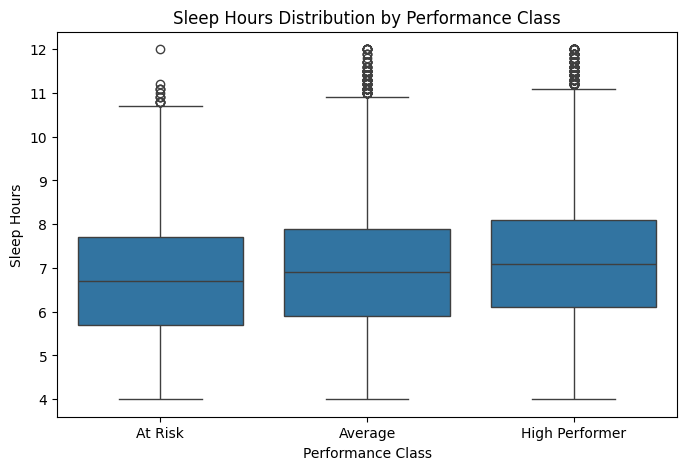

In [39]:


plt.figure(figsize=(8,5))
sns.boxplot(data=df, x='Performance', y='sleep_hours')
plt.title("Sleep Hours Distribution by Performance Class")
plt.xlabel("Performance Class")
plt.ylabel("Sleep Hours")
plt.show()


### How does stress level impact exam performance?

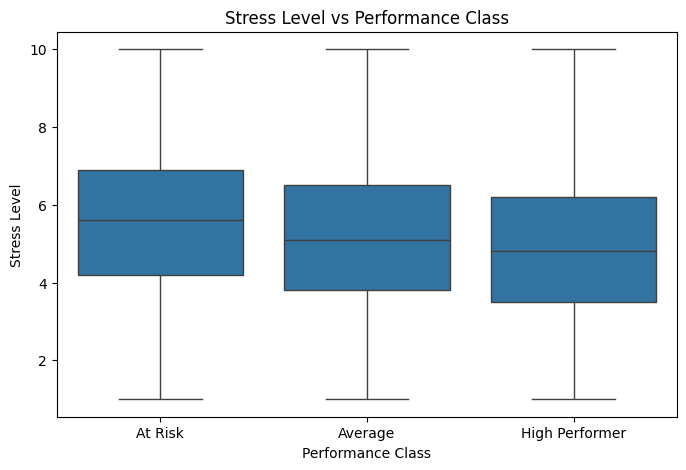

In [40]:
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x='Performance', y='stress_level')
plt.title("Stress Level vs Performance Class")
plt.xlabel("Performance Class")
plt.ylabel("Stress Level")
plt.show()


### Does motivation level affect exam outcome?

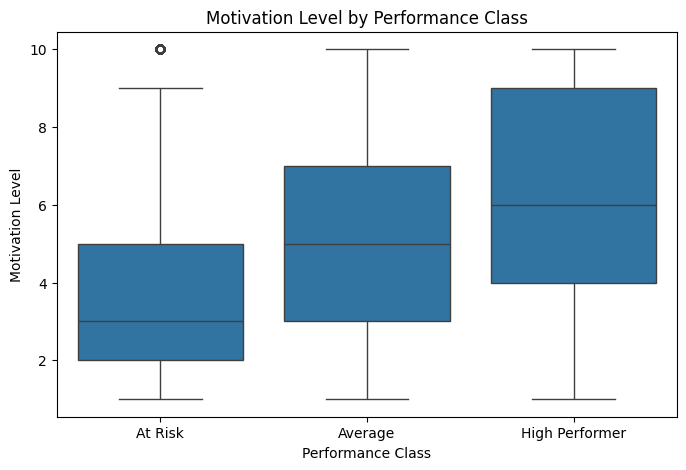

In [41]:
plt.figure(figsize=(8,5))
sns.boxplot(data=df, x='Performance', y='motivation_level')
plt.title("Motivation Level by Performance Class")
plt.xlabel("Performance Class")
plt.ylabel("Motivation Level")
plt.show()


### Does learning style influence exam performance?

In [115]:
fig = px.box(
    df,
    x='learning_style',
    y='exam_score',
    title='Exam Score by Learning Style'
)

fig.show()


In [50]:
import plotly.express as px

features = [
    'sleep_hours',
    'stress_level',
    'screen_time',
    'motivation_level',
    'study_efficiency'
]


df_grouped = df.groupby('Performance')[features].mean().reset_index()


df_melted = df_grouped.melt(
    id_vars='Performance',
    value_vars=features,
    var_name='Feature',
    value_name='Average Value'
)


fig = px.bar(
    df_melted,
    x='Feature',
    y='Average Value',
    color='Performance',
    barmode='group',
    title='Average Feature Values per Performance Class',
    height=700
)

fig.update_layout(
    xaxis_title="Feature",
    yaxis_title="Average Value",
    legend_title="Performance Class",
)

fig.show()



C:\Users\hp\AppData\Local\Temp\ipykernel_14844\47039847.py:12: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



## the corolation between object columns and target


# Feature Engineering

In [45]:
# Study Efficiency: 
df['study_efficiency'] = df['study_hours_per_day'] / (df['stress_level'] + 1)

In [ ]:
df['entertainment_screen_time'] = ( df['social_media_hours'] + df['netflix_hours'] )
df['screen_time_penalty'] = (df['entertainment_screen_time'] * df['exam_anxiety_score'])

df.drop( columns=['study_hours_per_day', 'social_media_hours', 'netflix_hours'], inplace=True)

In [ ]:
# Save cleaned data

df.to_csv('cleaned_df.csv',index=False)

# Data Preprocessing

### Split Data into Input Features and Target Column

In [140]:
data=df.drop(columns=['age','gender','major','learning_style','internet_quality','dropout_risk','semester','social_activity'],axis=1)

In [143]:
unnesc_cols=['attendance_percentage','mental_health_rating','parental_support_level','time_management_score','entertainment_screen_time']
data.drop(columns=unnesc_cols,inplace=True)

In [150]:
cat_unuseful=['part_time_job','parental_education_level','diet_quality','family_income_range','extracurricular_participation']
data.drop(columns=cat_unuseful,inplace=True)

In [ ]:
x = data.drop(['exam_score','Performance'], axis= 1)
y = data['Performance']

### Numerical pipeline

In [169]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler

scaler = RobustScaler()

num_rpipeline = Pipeline(steps= [ ('Scaling', scaler) ])
num_rpipeline

Pipeline(steps=[('Scaling', RobustScaler())])

In [170]:
sscaler = StandardScaler()

num_spipeline = Pipeline(steps= [ ('Scaling', sscaler) ])
num_spipeline

Pipeline(steps=[('Scaling', StandardScaler())])

### Categorical Pipeline

- OneHotEncoder Pipeline

In [171]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(drop= 'first', sparse_output= False)

ohe_pipeline = Pipeline(steps= [ ('OHE', ohe) ])
ohe_pipeline

Pipeline(steps=[('OHE', OneHotEncoder(drop='first', sparse_output=False))])

### Assign each column to corressponding Pipeline

In [174]:
num_columns=x.select_dtypes(include='number').drop(columns=['screen_time_penalty']).columns
num_rubst=['screen_time_penalty']
ohe_cat_columns=['study_environment' ,'access_to_tutoring']

In [ ]:
from sklearn.compose import ColumnTransformer

preprocessing = ColumnTransformer(transformers= [ ('Num_r', num_rpipeline, num_rubst),
                                                 ('Num_s', num_spipeline, num_columns),
                                                ('OHE', ohe_pipeline, ohe_cat_columns)
                                  
                                ])
preprocessing

ColumnTransformer(transformers=[('Num_r',
                                 Pipeline(steps=[('Scaling', RobustScaler())]),
                                 ['screen_time_penalty']),
                                ('Num_s',
                                 Pipeline(steps=[('Scaling',
                                                  StandardScaler())]),
                                 Index(['sleep_hours', 'exercise_frequency', 'stress_level', 'screen_time',
       'motivation_level', 'exam_anxiety_score', 'study_efficiency'],
      dtype='object')),
                                ('OHE',
                                 Pipeline(steps=[('OHE',
                                                  OneHotEncoder(drop='first',
                                                                sparse_output=False))]),
                                 ['study_environment', 'access_to_tutoring'])])

### Select Best Model

In [176]:
from sklearn.preprocessing import LabelEncoder
lab=LabelEncoder()
y=lab.fit_transform(y)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_validate
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from sklearn.preprocessing import PolynomialFeatures

models = [
    ('LR', LogisticRegression(
        multi_class='multinomial',
        solver='lbfgs',
        class_weight='balanced',
        max_iter=1000,
        random_state=42
    )),

    ('KNN', KNeighborsClassifier()),

    ('Gaussian NB', GaussianNB()),

    ('DT', DecisionTreeClassifier(
        max_depth=10,
        class_weight='balanced',
        random_state=42
    )),

    ('RF', RandomForestClassifier(
        n_estimators=300,
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )),

    ('XGB', XGBClassifier(
        objective='multi:softprob',
        num_class=5,
        eval_metric='mlogloss',
        random_state=42,
        n_jobs=-1
    )),

    ('LGB', LGBMClassifier(
        objective='multiclass',
        num_class=5,
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    ))
]


for model in models:

    model_pipeline = Pipeline(steps= [ ('Preprocessing', preprocessing), ('Model', model[1]) ])
    scoring = ['accuracy', 'precision_macro', 'recall_macro', 'f1_macro']
    cv = cross_validate(model_pipeline, x, y, scoring=scoring, cv=5, return_train_score=True, n_jobs=-1 )

    print(model[0])

    print('Train Accuracy:', round(cv['train_accuracy'].mean(), 3))
    print('Test  Accuracy:', round(cv['test_accuracy'].mean(), 3))

    print('Train Precision:', round(cv['train_precision_macro'].mean(), 3))
    print('Test  Precision:', round(cv['test_precision_macro'].mean(), 3))

    print('Train Recall:', round(cv['train_recall_macro'].mean(), 3))
    print('Test  Recall:', round(cv['test_recall_macro'].mean(), 3))

    print('Train F1:', round(cv['train_f1_macro'].mean(), 3))
    print('Test  F1:', round(cv['test_f1_macro'].mean(), 3))

    print('-' * 80)


LR
Train Accuracy: 0.508
Test  Accuracy: 0.507
Train Precision: 0.451
Test  Precision: 0.45
Train Recall: 0.535
Test  Recall: 0.534
Train F1: 0.449
Test  F1: 0.448
--------------------------------------------------------------------------------
KNN
Train Accuracy: 0.686
Test  Accuracy: 0.527
Train Precision: 0.616
Test  Precision: 0.421
Train Recall: 0.603
Test  Recall: 0.416
Train F1: 0.609
Test  F1: 0.418
--------------------------------------------------------------------------------
Gaussian NB
Train Accuracy: 0.554
Test  Accuracy: 0.554
Train Precision: 0.453
Test  Precision: 0.452
Train Recall: 0.483
Test  Recall: 0.482
Train F1: 0.46
Test  F1: 0.459
--------------------------------------------------------------------------------
DT
Train Accuracy: 0.516
Test  Accuracy: 0.463
Train Precision: 0.486
Test  Precision: 0.431
Train Recall: 0.588
Test  Recall: 0.501
Train F1: 0.477
Test  F1: 0.417
--------------------------------------------------------------------------------


### Hyperparameter Tuning

- GradientBoostingRegressor

In [ ]:
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
xgb = XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    eval_metric='mlogloss',
    random_state=42,
    n_jobs=-1
)

param_dist = {
    'Model__n_estimators': [200, 300, 500],
    'Model__max_depth': [3, 4, 6],
    'Model__learning_rate': [0.01, 0.05, 0.1],
    'Model__subsample': [0.7, 0.8, 1.0],
    'Model__colsample_bytree': [0.7, 0.8, 1.0],
    'Model__gamma': [0, 0.1, 0.3],
    'Model__reg_alpha': [0, 0.1, 0.5],
    'Model__reg_lambda': [1, 1.5, 2]
}

pipeline = Pipeline(steps=[
    ('Preprocessing', preprocessing),
    ('Model', xgb)
])

In [192]:
from sklearn.model_selection import RandomizedSearchCV

random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_dist,
    n_iter=30,
    scoring='f1_macro',
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

random_search.fit(x, y)


Fitting 5 folds for each of 30 candidates, totalling 150 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('Preprocessing',
                                              ColumnTransformer(transformers=[('Num_r',
                                                                               Pipeline(steps=[('Scaling',
                                                                                                RobustScaler())]),
                                                                               ['screen_time_penalty']),
                                                                              ('Num_s',
                                                                               Pipeline(steps=[('Scaling',
                                                                                                StandardScaler())]),
                                                                               Index(['sleep_hours', 'exercise_frequency', 'stress_level', 'screen_time',
       'motivation_level', 'exam_anxiety_score', 'stud...
                                                            n_jobs=-1,
                                                            num_class=3, ...))]),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'Model__colsample_bytree': [0.7, 0.8,
                                                                    0.9],
                                        'Model__gamma': [0, 0.1, 0.2],
                                        'Model__learning_rate': [0.01, 0.05,
                                                                 0.1],
                                        'Model__max_depth': [3, 4, 5, 6],
                                        'Model__min_child_weight': [1, 3, 5],
                                        'Model__n_estimators': [100, 200, 300],
                                        'Model__subsample': [0.7, 0.8, 0.9]},
                   random_state=42, scoring='f1_macro', verbose=1)

In [193]:
print("Best F1 Macro:", random_search.best_score_)
print("Best Params:")
for k, v in random_search.best_params_.items():
    print(k, ":", v)

Best F1 Macro: 0.40259439660840235
Best Params:
Model__subsample : 0.7
Model__n_estimators : 300
Model__min_child_weight : 5
Model__max_depth : 3
Model__learning_rate : 0.1
Model__gamma : 0.1
Model__colsample_bytree : 0.7


In [194]:
best_model=random_search.best_estimator_

In [195]:
import joblib

joblib.dump(best_model, 'exam_score_calss_model.pkl')

['exam_score_calss_model.pkl']

- Test the Model

In [196]:
GD_model = joblib.load('exam_score_calss_model.pkl')

GD_model.predict(x.head(1))

array([2])